<a href="https://colab.research.google.com/github/dakilaledesma/MMDet_Plants/blob/main/MMDet_Peltandra.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.10.0+cu111 torchvision==0.11.1+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
# !pip install mmcv-full
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html

# Install mmdetection
!pip install mmdet
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

# !pip install -e .

# install Pillow 7.0.0 back in order to avoid bug in colab
!pip install Pillow

Looking in links: https://download.pytorch.org/whl/torch_stable.html
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
     |████████████████████████████████| 58.0 MB 1.4 MB/s 
     |████████████████████████████████| 185 kB 4.3 MB/s 
     |████████████████████████████████| 1.2 MB 4.1 MB/s 
  Created wheel for terminaltables: filename=terminaltables-3.1.0-py3-none-any.whl size=15354 sha256=25bb23921d239970430ce6e32111b4495c5ebdfacf14805e25101cb1605a9c4e
  Stored in directory: /root/.cache/pip/wheels/ba/ad/c8/2d98360791161cd3db6daf6b5e730f34021fc9367d5879f497
Successfully built terminaltables
Cloning into 'mmdetection'...
remote: Enumerating objects: 21984, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 21984 (delta 0), reused 5 (delta 0), pack-reused 21974
Receiving objects: 100% (21984/21984), 25.25 MiB | 11.45 MiB/s, done.
Resolving deltas: 100% (15401/15401), done.
/content/mmdetec

In [ ]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.10.0+cu111 True
2.18.1
11.1
GCC 7.3


In [ ]:
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth \
      -O checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth

mkdir: cannot create directory ‘checkpoints’: File exists
--2021-11-30 13:06:06--  https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.75.20.5
Connecting to download.openmmlab.com (download.openmmlab.com)|47.75.20.5|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 177867103 (170M) [application/octet-stream]
Saving to: ‘checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth’

checkpoints/mask_rc 100%[===================>] 169.63M  14.1MB/s    in 12s     

2021-11-30 13:06:20 (14.2 MB/s) - ‘checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth’ saved [177867103/177867103]



In [ ]:
from mmcv import Config
cfg = Config.fromfile('mmdetection/configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_1x_coco.py')

In [ ]:
%cd /content
!unzip Peltandra_COCO.zip -d peltandra

/content
mmdetection  Peltandra_COCO.zip  sample_data
Archive:  Peltandra_COCO.zip
   creating: peltandra/Peltandra_COCO/
  inflating: peltandra/Peltandra_COCO/.DS_Store  
  inflating: peltandra/__MACOSX/Peltandra_COCO/._.DS_Store  
   creating: peltandra/Peltandra_COCO/images/
  inflating: peltandra/Peltandra_COCO/annotations.json  
  inflating: peltandra/__MACOSX/Peltandra_COCO/._annotations.json  
  inflating: peltandra/Peltandra_COCO/images/sagittifolia_00043.jpg  
  inflating: peltandra/Peltandra_COCO/images/virginica_00046.jpg  
  inflating: peltandra/Peltandra_COCO/images/virginica_00047.jpg  
  inflating: peltandra/Peltandra_COCO/images/sagittifolia_00042.jpg  
  inflating: peltandra/Peltandra_COCO/images/sagittifolia_00040.jpg  
  inflating: peltandra/Peltandra_COCO/images/virginica_00045.jpg  
  inflating: peltandra/Peltandra_COCO/images/virginica_00050.jpg  
  inflating: peltandra/Peltandra_COCO/images/sagittifolia_00041.jpg  
  inflating: peltandra/Peltandra_COCO/images/sag

In [ ]:
# from mmdet.apis import set_random_seed

# Modify dataset type and path
cfg.dataset_type = 'CocoDataset'
cfg.data_root = 'peltandra/Peltandra_COCO/'

cfg.data.test.type = 'CocoDataset'
cfg.data.test.data_root = 'peltandra/Peltandra_COCO/'
cfg.data.test.ann_file = 'annotations.json'
cfg.data.test.img_prefix = 'images'

cfg.data.train.type = 'CocoDataset'
cfg.data.train.data_root = 'peltandra/Peltandra_COCO/'
cfg.data.train.ann_file = 'annotations.json'
cfg.data.train.img_prefix = 'images'

cfg.data.val.type = 'CocoDataset'
cfg.data.val.data_root = 'peltandra/Peltandra_COCO/'
cfg.data.val.ann_file = 'annotations.json'
cfg.data.val.img_prefix = 'images'
cfg.data.train.classes = ('leaf',)

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 1
# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch
cfg.load_from = 'checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth'

# Set up working dir to save files and logs.
cfg.work_dir = './tutorial_exps'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup = None
cfg.lr_config.policy = 'step'
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 12
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 12

# Set seed thus the results are more reproducible
cfg.seed = 0
# set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)


# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')


Config:
model = dict(
    type='FasterRCNN',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=False),
        norm_eval=True,
        style='caffe',
        init_cfg=dict(
            type='Pretrained',
            checkpoint='open-mmlab://detectron2/resnet50_caffe')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='Cro

In [ ]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
import mmcv
import os.path as osp


# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES
print(model.CLASSES)

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


2021-11-30 13:14:18,209 - mmdet - INFO - load checkpoint from local path: checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth


('leaf',)
loading annotations into memory...
Done (t=0.13s)
creating index...
index created!


2021-11-30 13:14:18,339 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoint, the shape in current model is torch.Size([4]).
unexpected key in source state_dict: roi_head.mask_head.convs.0.conv.weight, roi_head.mask_head.convs.0.conv.bias, roi_head.mask_head.convs.1.conv.weight, roi_head.mask_head.convs.1.conv.bias, roi_head.mask_head.convs.2.conv.weight, roi_hea

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 93/93, 11.4 task/s, elapsed: 8s, ETA:     0s

KeyError: ignored

### Understand the log
From the log, we can have a basic understanding the training process and know how well the detector is trained.

Firstly, the ResNet-50 backbone pre-trained on ImageNet is loaded, this is a common practice since training from scratch is more cost. The log shows that all the weights of the ResNet-50 backbone are loaded except the `conv1.bias`, which has been merged into `conv.weights`.

Second, since the dataset we are using is small, we loaded a Mask R-CNN model and finetune it for detection. Because the detector we actually using is Faster R-CNN, the weights in mask branch, e.g. `roi_head.mask_head`, are `unexpected key in source state_dict` and not loaded.
The original Mask R-CNN is trained on COCO dataset which contains 80 classes but KITTI Tiny dataset only have 3 classes. Therefore, the last FC layer of the pre-trained Mask R-CNN for classification has different weight shape and is not used.

Third, after training, the detector is evaluated by the default VOC-style evaluation. The results show that the detector achieves 54.1 mAP on the val dataset,
 not bad!

## Test the trained detector

After finetuning the detector, let's visualize the prediction results!

In [ ]:
!unzip /content/test.zip -d /content/test

Archive:  /content/test.zip
   creating: /content/test/test/
  inflating: /content/test/test/sagittifolia_00282.jpg  
  inflating: /content/test/test/virginica_02240.jpg  
  inflating: /content/test/__MACOSX/test/._virginica_02240.jpg  
  inflating: /content/test/test/sagittifolia_00283.jpg  
  inflating: /content/test/test/sagittifolia_00284.jpg  
  inflating: /content/test/test/sagittifolia_00285.jpg  
  inflating: /content/test/test/sagittifolia_00286.jpg  
  inflating: /content/test/test/virginica_02234.jpg  
  inflating: /content/test/test/virginica_02233.jpg  
  inflating: /content/test/test/virginica_02239.jpg  
  inflating: /content/test/test/virginica_02238.jpg  


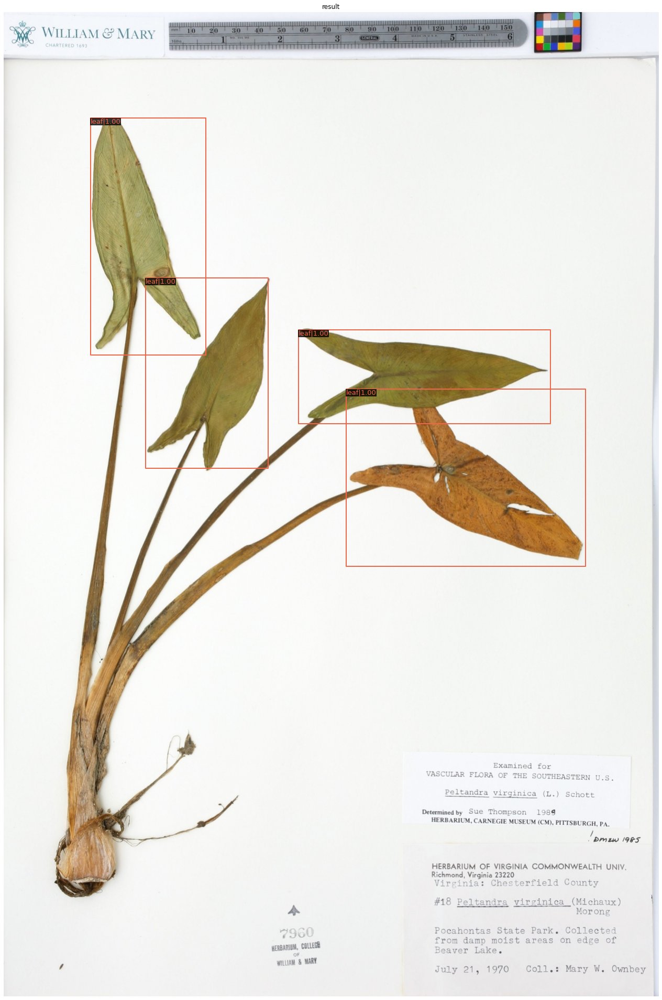

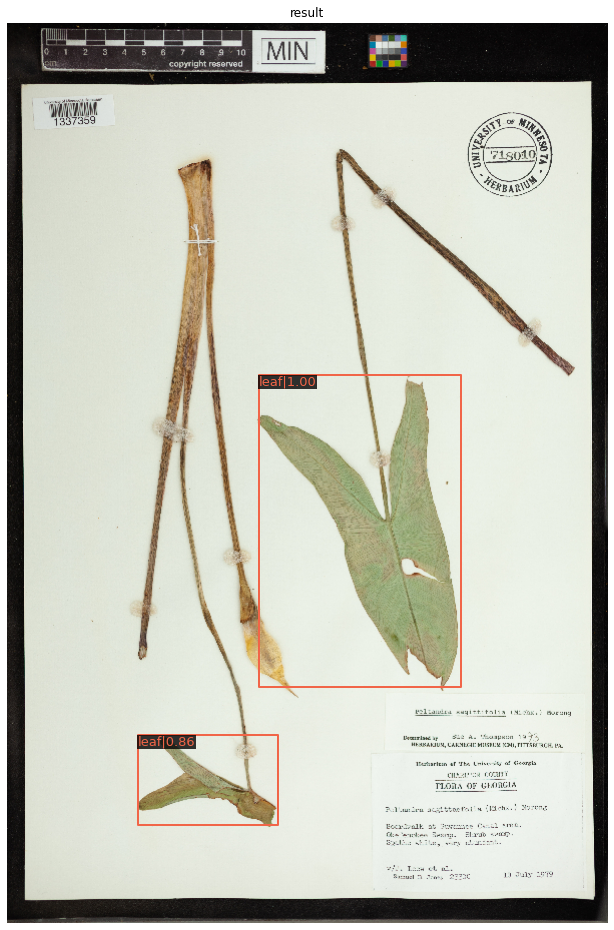

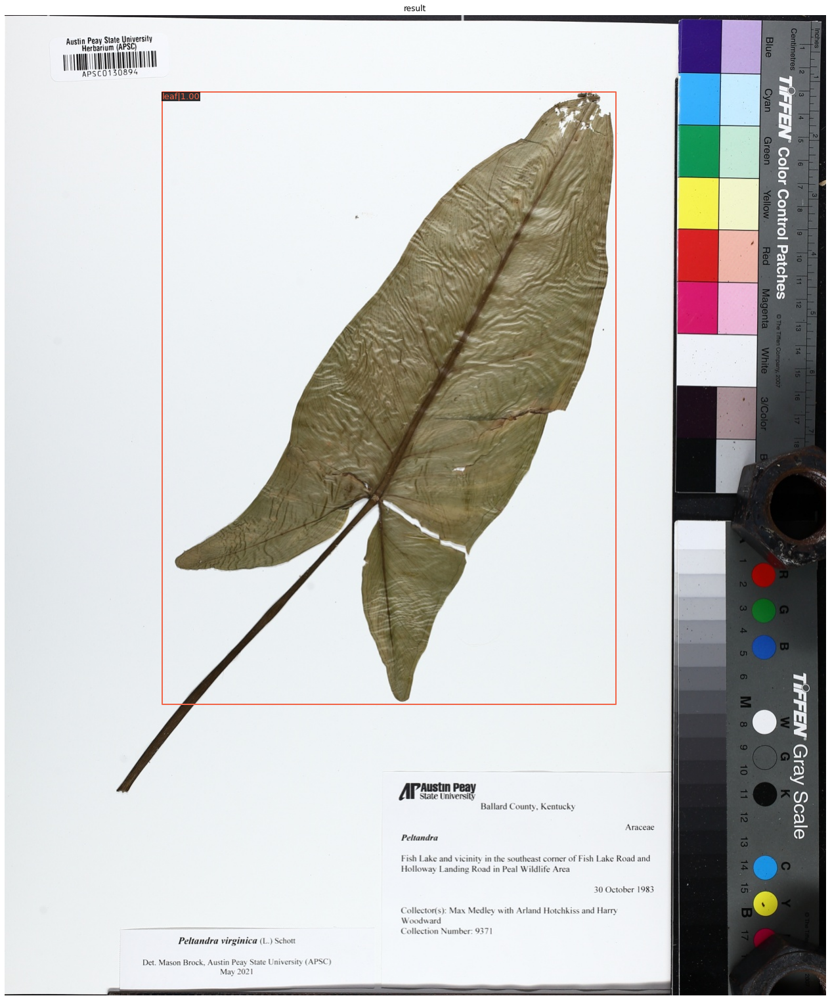

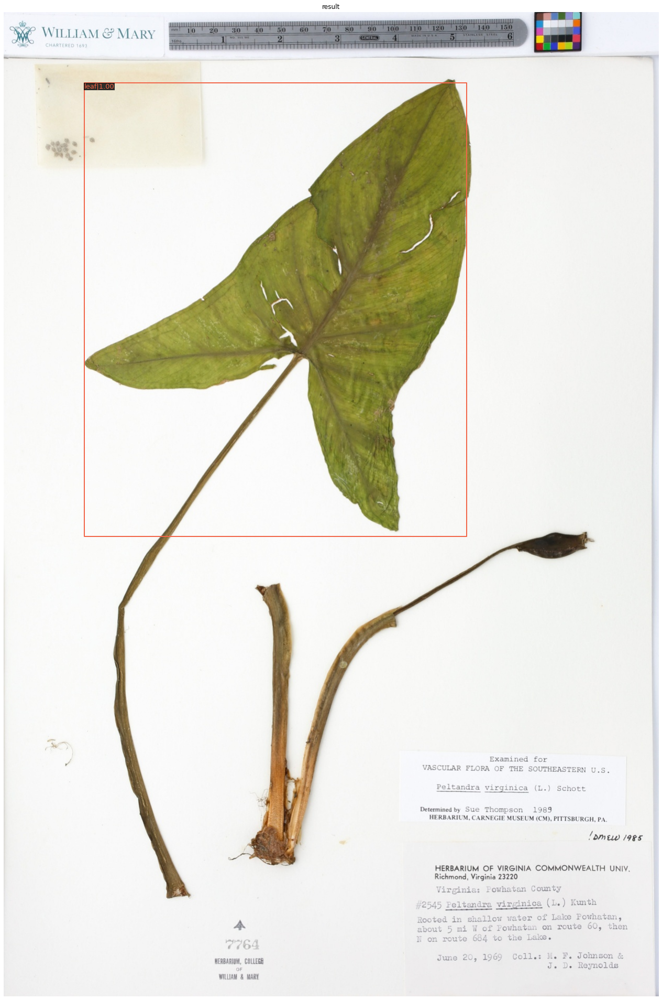

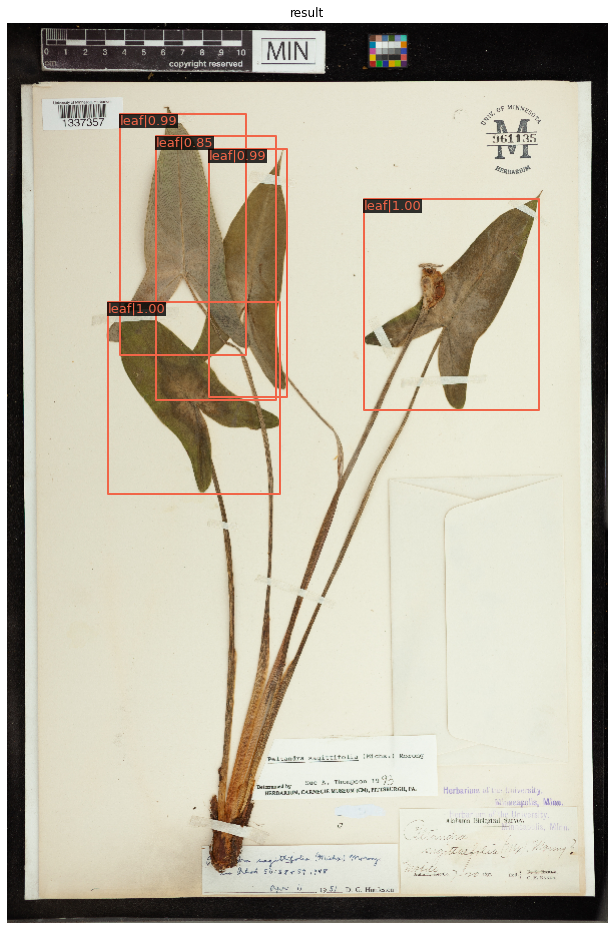

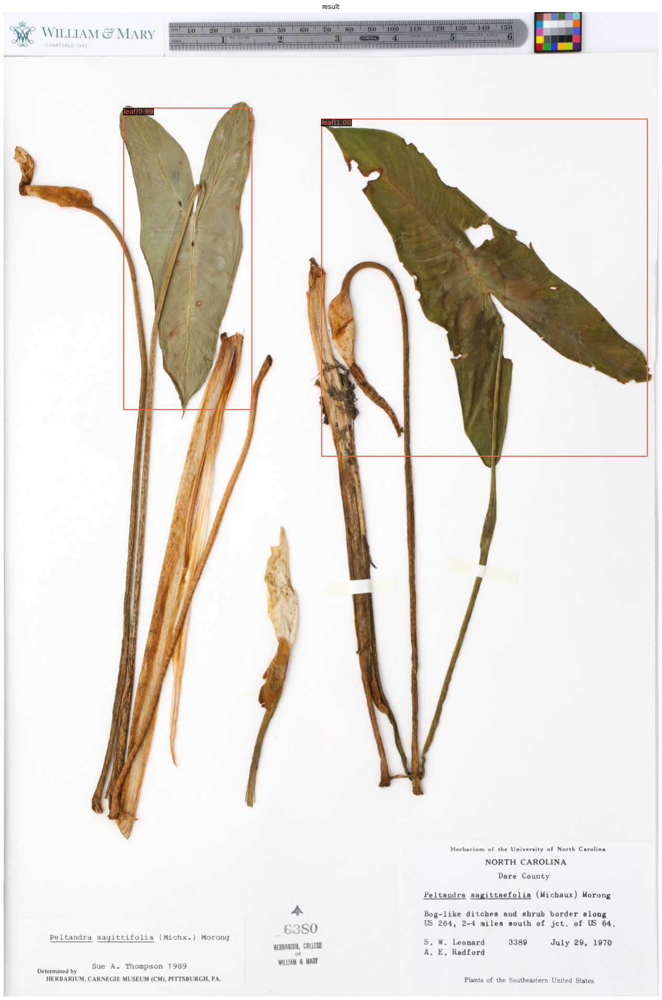

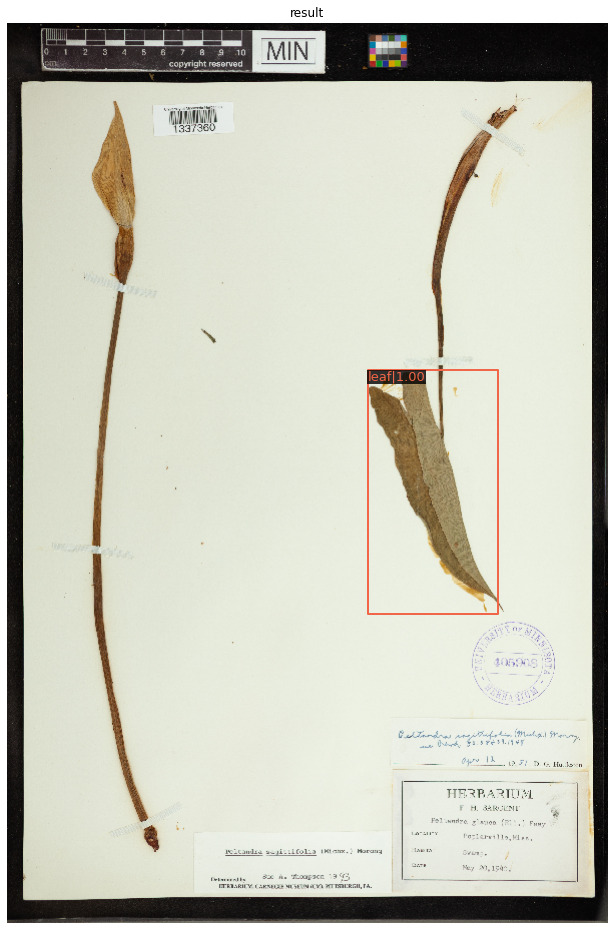

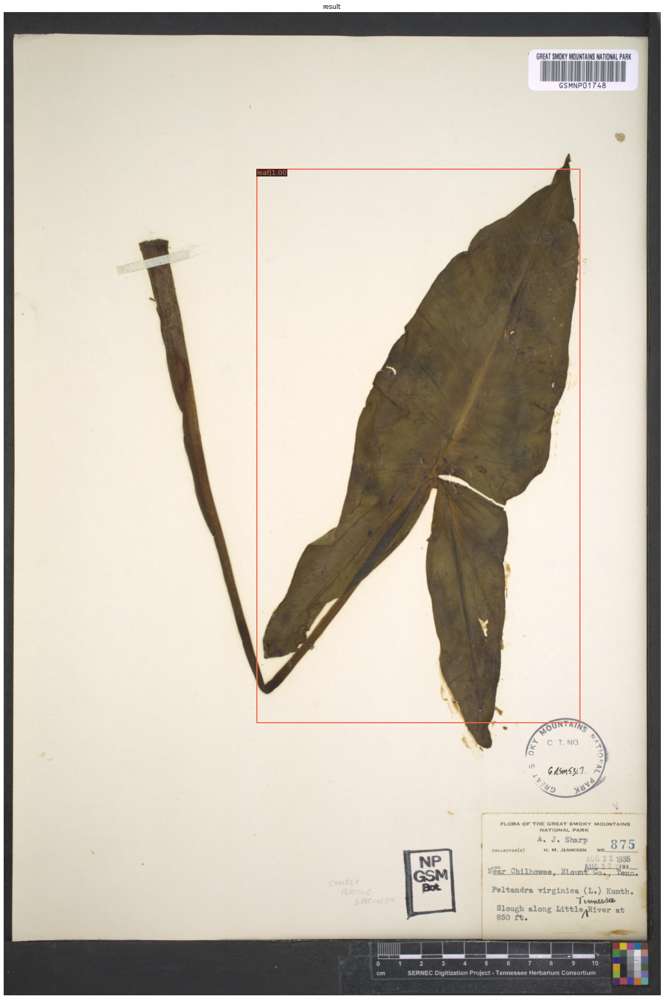

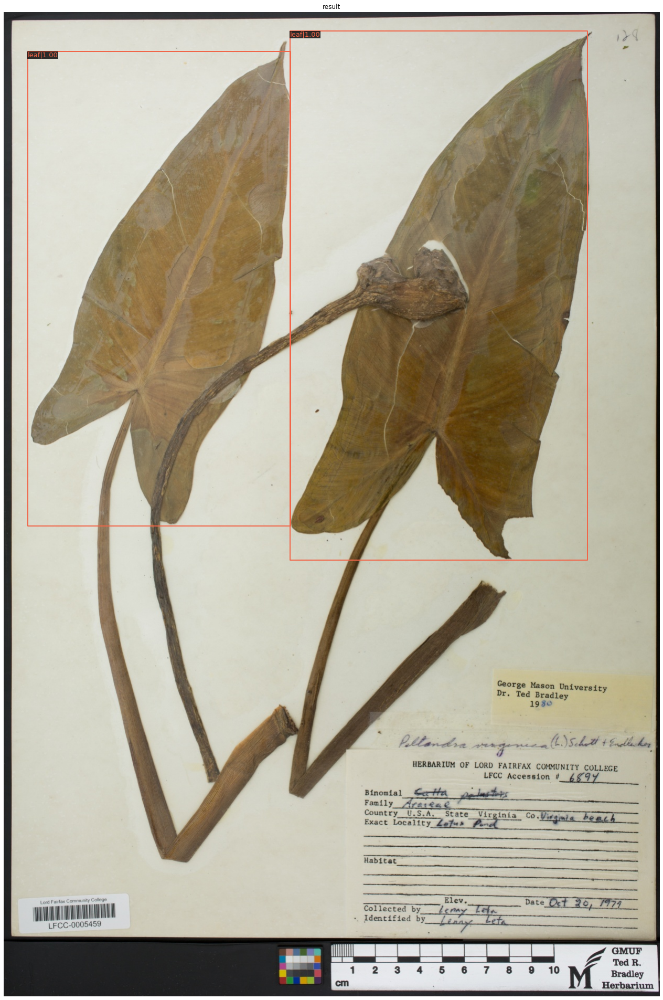

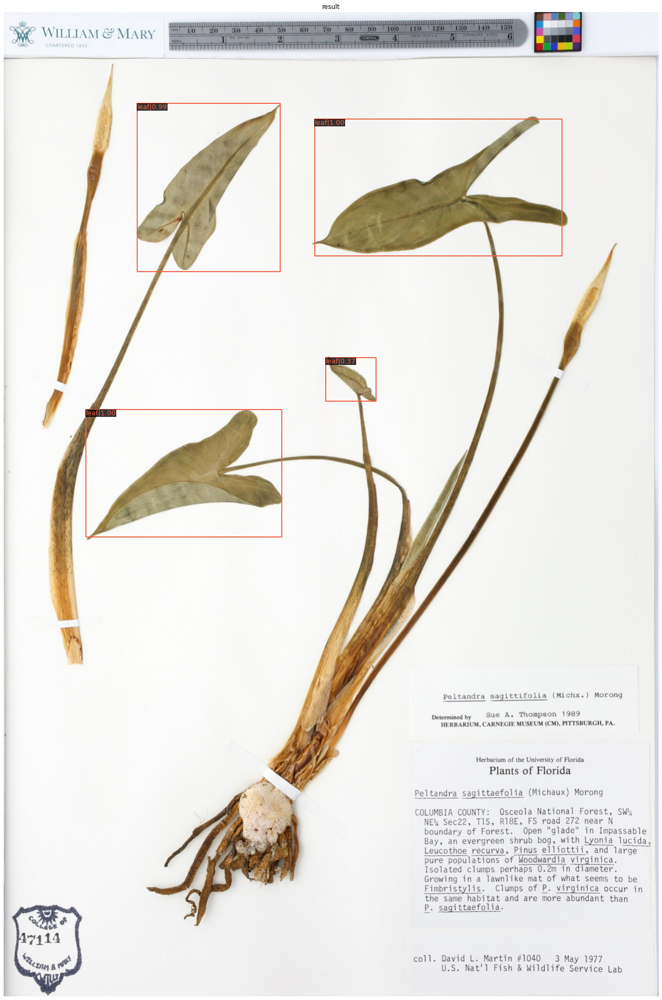

In [ ]:
from mmdet.apis import inference_detector, init_detector, show_result_pyplot
from glob import glob

model.cfg = cfg

for fn in glob("/content/test/test/*.jpg"):
  img = mmcv.imread(fn)
  result = inference_detector(model, img)
  show_result_pyplot(model, img, result)